In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ['CUDA_VISIBLE_DEVICES'] = '0'
os.environ['CUBLAS_WORKSPACE_CONFIG'] = ':4096:8'

os.environ['PROTOCOL_BUFFERS_PYTHON_IMPLEMENTATION'] = "python"

import random
import torch
import numpy as np

seed = 42

random.seed(seed)
torch.manual_seed(seed)
torch.use_deterministic_algorithms(True)

import torch.nn.functional as F
import torch
from tqdm import tqdm

In [2]:
# Define beta schedule
T = 512
betas = torch.linspace(start=0.0001, end=0.02, steps=T)

# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

In [3]:
from torchvision import transforms 
import torch
import torchvision
from torch.utils.data import DataLoader
import numpy as np

IMG_SIZE = 64
BATCH_SIZE = 100

def get_dataset(path):
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1] 
        transforms.Normalize(0.5, 0.5)
    ]
    data_transform = transforms.Compose(data_transforms)

    train = torchvision.datasets.StanfordCars(root=path, download=True, 
                                         transform=data_transform)

    test = torchvision.datasets.StanfordCars(root=path, download=True, 
                                         transform=data_transform, split='test')
    return torch.utils.data.ConcatDataset([train, test])

data = get_dataset("/cnvrg/Computer-Vision-and-Generative-AI/lesson-3-gans/exercises/solution/")
dataloader = DataLoader(
    data, 
    batch_size=BATCH_SIZE, 
    shuffle=True, 
    drop_last=False, 
    pin_memory=True, 
    num_workers=8
)

In [25]:
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

@torch.no_grad()
def make_inference(input_noise):
    
    x = input_noise
    bs = x.shape[0]
    
    for time_step in range(0,T)[::-1]:
        t = torch.full((bs,), time_step, device=device, dtype=torch.long)

        model_mean = sqrt_recip_alphas[t].view(bs, 1, 1, 1) * (
            x - betas[t].view(bs, 1, 1, 1) * model(x, t) / 
            sqrt_one_minus_alphas_cumprod[t].view(bs, 1, 1, 1)
        )
        
        noise = torch.randn_like(x) if time_step > 0 else 0
        
        x = model_mean + torch.sqrt(posterior_variance[t].view(bs, 1, 1, 1)) * noise

    x = torch.clamp(x, -1, 1)
    
    return x

    
@torch.no_grad()
def sample_image(image, device='cpu', forward=True, num_images=16, dpi=75, interleave=False):
    stepsize = int(T/num_images)
    
    imgs = []
    noises = []
    
    if forward:
        for i in range(0, T, stepsize):
            t = torch.full((1,), i, device=device, dtype=torch.long)
            
            # Forward diffusion process
            bs = image.shape[0]
            noise = torch.randn_like(image, device=image.device)
            img = (
                sqrt_alphas_cumprod[t].view(bs, 1, 1, 1) * image + 
                sqrt_one_minus_alphas_cumprod[t].view(bs, 1, 1, 1) * noise
            )
            
            imgs.append(torch.clamp(img, -1, 1).squeeze(dim=0))
            noises.append(torch.clamp(noise, -1, 1).squeeze(dim=0))
    
    else:
        x = image.unsqueeze(dim=0)
        for time_step in range(0,T)[::-1]:
            t = torch.full((1,), time_step, device=device, dtype=torch.long)
            
            bs = x.shape[0]

            model_mean = sqrt_recip_alphas[t] * (
                x - betas[t].view(bs, 1, 1, 1) * model(x, t) / 
                sqrt_one_minus_alphas_cumprod[t].view(bs, 1, 1, 1)
            )

            noise = torch.randn_like(x) if time_step > 0 else 0

            img = model_mean + torch.sqrt(posterior_variance[t].view(bs, 1, 1, 1)) * noise
            
            if (time_step % stepsize == 0) or time_step==0:
                imgs.append(torch.clamp(img.squeeze(dim=0), -1, 1))
    
    if interleave:
        imgs = [item for pair in zip(imgs, noises) for item in pair]
        
    fig, sub = plt.subplots(dpi=dpi)
    sub.imshow(
        np.transpose(
            make_grid(
                imgs, 
                padding=0,
                normalize=True,
                nrow=8,
            ).cpu(),
            (1,2,0)
        )
    )
    _ = sub.axis("off")
    
    return fig, imgs[-1]

In [5]:
# Simulate forward diffusion
batch = next(iter(dataloader))

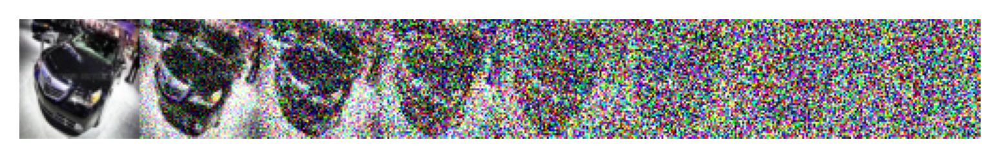

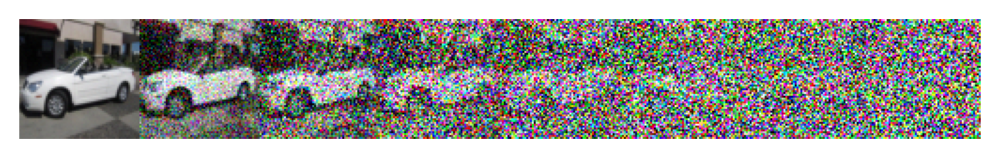

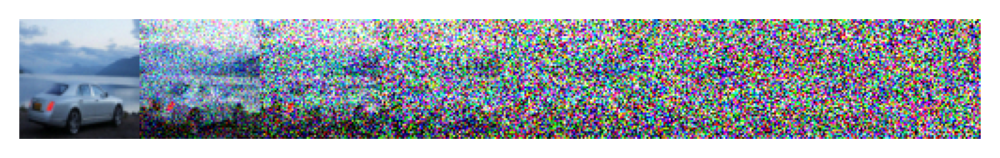

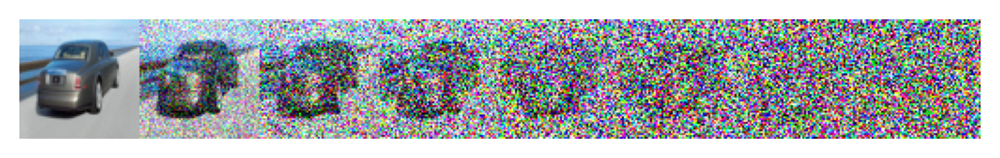

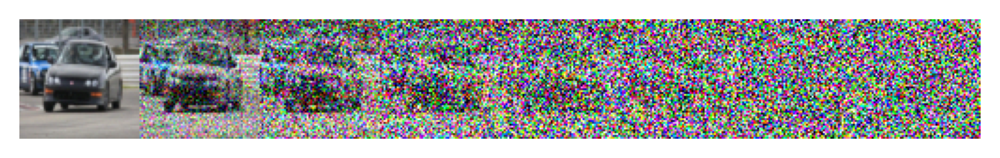

...

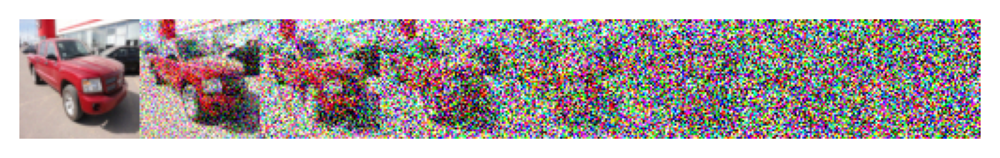

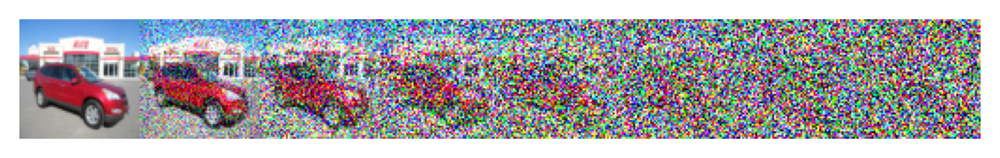

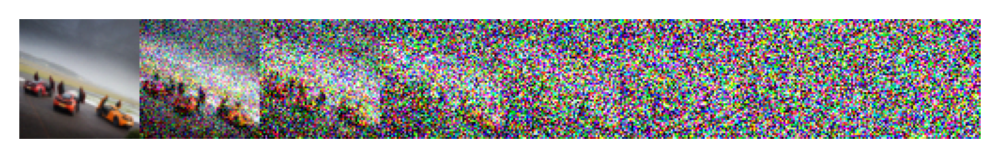

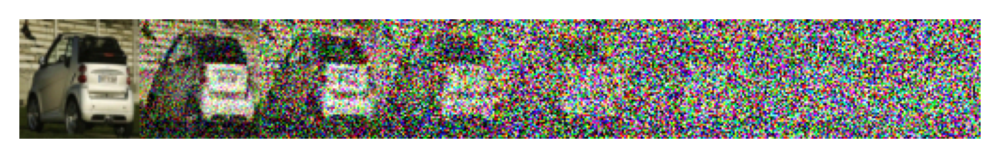

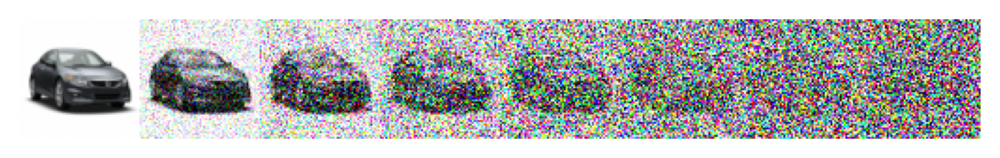

In [6]:
for i in range(20):
    image = batch[0][i]
    _ = sample_image(image.unsqueeze(dim=0), num_images=7, dpi=300, interleave=False)

In [7]:
from unet import UNet
model = UNet(ch_mults = (1, 2, 2, 2))
print("Num params: ", sum(p.numel() for p in model.parameters()))
# # Num params:  223617155
# print(model)

Num params:  54563779


In [8]:
from torch.optim import Adam
from torch.optim.lr_scheduler import CosineAnnealingLR

device = "cuda" if torch.cuda.is_available() else "cpu"
# Move everything to GPU
model.to(device)

sqrt_alphas_cumprod = sqrt_alphas_cumprod.to(device)
alphas = alphas.to(device)
alphas_cumprod = alphas_cumprod.to(device)
alphas_cumprod_prev = alphas_cumprod_prev.to(device)
sqrt_recip_alphas = sqrt_recip_alphas.to(device)
sqrt_alphas_cumprod = sqrt_alphas_cumprod.to(device)
sqrt_one_minus_alphas_cumprod = sqrt_one_minus_alphas_cumprod.to(device)
posterior_variance = posterior_variance.to(device)
betas = betas.to(device)

base_lr = 0.0001
optimizer = Adam(model.parameters(), lr=base_lr)

In [13]:
epochs = 2 # Total number of epochs
T_max = epochs  # Number of epochs for Cosine Annealing
warmup_epochs = 0  # Number of warm-up epochs
scheduler = CosineAnnealingLR(
    optimizer, 
    T_max=T_max - warmup_epochs, 
    eta_min=1e-6
)

criterion = torch.nn.MSELoss()

fixed_noise = torch.randn((3, IMG_SIZE, IMG_SIZE), device=device)

epochs_bar = tqdm(range(epochs), total=epochs, desc='Epochs', position=0)

for epoch in epochs_bar:
    
    if epoch < warmup_epochs:
        # Linear warm-up
        lr = base_lr * (epoch + 1) / warmup_epochs
        for param_group in optimizer.param_groups:
            param_group['lr'] = lr
    else:
        # Cosine Annealing after warm-up
        scheduler.step()

    current_lr = optimizer.param_groups[0]['lr']
    
    last_loss = 0
    
    for batch, _ in dataloader:
        
        batch = batch.to(device)
        bs = batch.shape[0]
        
        optimizer.zero_grad()

        t = torch.randint(0, T, (batch.shape[0],), device=device).long()
        
        # Generate targets for the UNet and apply them to the images
        noise = torch.randn_like(batch, device=device)
        x_noisy = (
            sqrt_alphas_cumprod[t].view(bs, 1, 1, 1) * batch + 
            sqrt_one_minus_alphas_cumprod[t].view(bs, 1, 1, 1) * noise
        )
        
        # x_noisy, noise = forward_diffusion_sample(batch, t, device)
        
        # The model predicts the noisy pixels.
        # Note that we pass in the
        # time step t
        noise_pred = model(x_noisy, t)
        loss = criterion(noise, noise_pred)
        
        loss.backward()
        optimizer.step()
        
        last_loss = loss.item()

    if epoch % 5 == 0:
#         print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
        with torch.no_grad():
            fig, _ = sample_image(fixed_noise, forward=False, device=device)
        os.makedirs("diffusion_output_long", exist_ok=True)
        fig.savefig(f"diffusion_output_long/frame_{epoch:05d}.png")
        plt.close(fig)
    
    epochs_bar.set_description(f"loss: {last_loss:.3f}, lr: {current_lr:.6f}")

loss: 0.125, lr: 0.000001: 100% 2/2 [01:03<00:00, 31.59s/it]


In [26]:
input_noise = torch.randn((8, 3, IMG_SIZE, IMG_SIZE), device=device)
imgs = make_inference(input_noise)

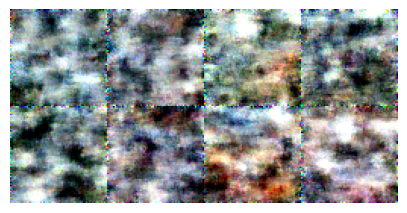

In [27]:
fig, sub = plt.subplots(figsize=(5, 5))
sub.imshow(
    np.transpose(
        make_grid(
            imgs, 
            padding=0,
            normalize=True,
            nrow=4,
        ).cpu(),
        (1,2,0)
    )
)
_ = sub.axis("off")

In [ ]:
linear_beta_schedule(12)